# Final Project Notebook - Spring 2024

# This final project will demonstrate how modeling software can be used to examine and sort data.  AlexNet trains on thousands of images and is used to classify them into categories based on the content of the image.  I will sort between different types of cars using AlexNet in this final project.

The first cell imports libraries of prewritten python code.

Libraries give the program access to custom functions written by others.

Here are some common libraries and their usages:

1. MatPlotLib - Generates plots and graphs using data
2. ImageIO - Allows importing and easily editing images
3. Torch - Framework for Neural Networking, to normalize data for use by different neural networks including AlexNet
4. Numpy (Numerical Python) - Contains a large amount of non-default python mathematical operations for streamlined computation

In [ ]:
import matplotlib.pyplot as plt #import libraries
import imageio
import torch
import torchvision
from torchvision import models, transforms
import numpy as np
from torchvision.models import *
from PIL import Image
import requests
from torchvision import models
from torchsummary import summary

**FUNCTIONS:** Functions are reusable sections of code that can be referenced for specific tasks.  Functions can take inputs and do operations, and can give outputs.

*Plot:* A custom plot function lets the program set defaults in the settings of MatPlotLib and save them to be reused.

In [ ]:
def plot(x): #name of the function and the input variable
    fig, ax = plt.subplots() #retrieving the default plotting area from the MatPlotLib library
    im = ax.imshow(x,cmap='gray') #putting the input into the plotting area, changing the colormap to black and white, saving it to a variable "im"
    ax.axis('off') #turning the axis off
    fig.set_size_inches(20, 20) #setting the size of the plot area
    plt.show() #displaying the plot in the notebook

The ImageIO library has functions to read the image stored at a specific url.

In [ ]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png') #getting the image from the url

<ipython-input-3-2086ec9e0cf6>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


The program stores the image to the variable IM, and the function "plot()" can be used to display the image stored there.

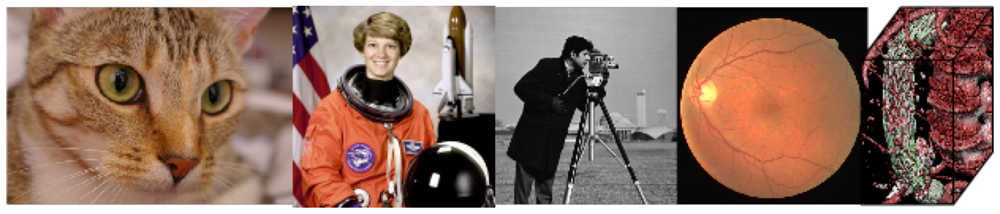

In [ ]:
plot(im) #displaying the image

AlexNet is open source - Anyone can use it in their program

In [ ]:
net = alexnet(pretrained=True).cuda(0) #saving the downloaded version of alexnet into a variable
#getting the pretrained version
#sending it to the Google GPU using the cuda method

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:05<00:00, 46.7MB/s]


All data needs to be normalized for a neural network to understand it.  A group of images with different brightness levels, contrast, etc. will be harder if not impossible for a neural network to understand.

In [ ]:
normalize = transforms.Normalize( #setting the defaults for image transforms, forcing color channels to have the same mean value and standard deviation
   mean=[0.485, 0.456, 0.406],
   std=[0.229, 0.224, 0.225]
)
preprocess = transforms.Compose([ #setting all the images to the same size, and cropping them to be square
   transforms.Resize(256),
   transforms.CenterCrop(224),
   transforms.ToTensor(),
   normalize
])

In [ ]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg') #getting a new image from a url

<ipython-input-7-772805ffc2cf>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


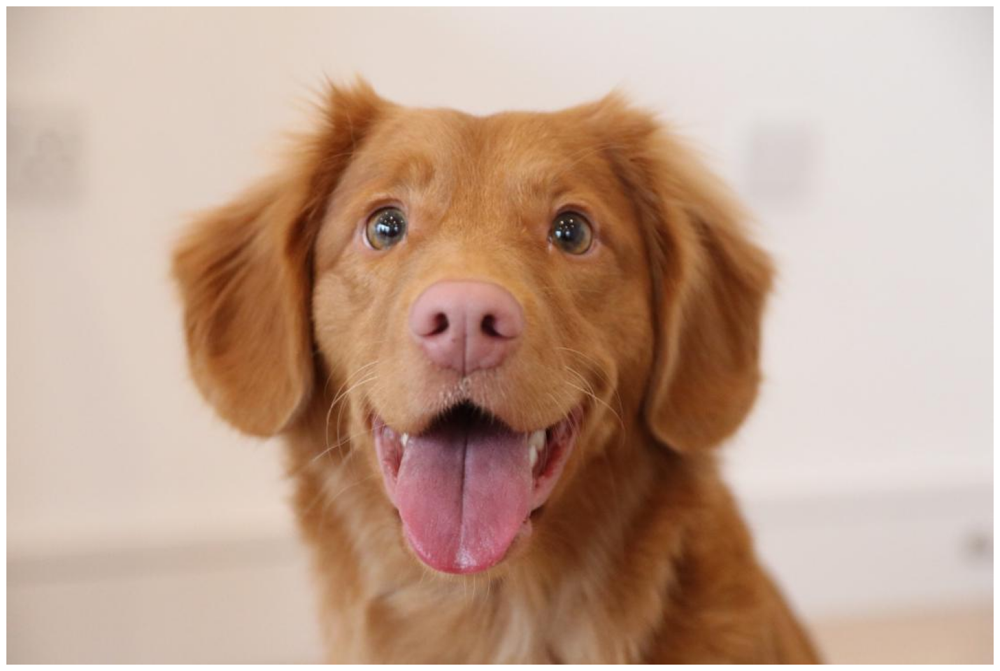

In [ ]:
plot(im) #displaying the new image using the plot() function

**Objects:** An object is similar to a variable, but has "methods."  Objects store data but also use methods (built-in functions) to change, reshape, or otherwise change the stored data.

In [ ]:
image = Image.fromarray(im) #converting the image to an Image object from the Image library, converting using the fromarray method

In [ ]:
img_tensor = preprocess(image) #using the preprocess method to normalize the image and its color channels

In [ ]:
img_tensor = img_tensor.unsqueeze_(0) #using the unsqueeze method to shift the data over by one dimension

In [ ]:
img_tensor.shape #calling the shape method

torch.Size([1, 3, 224, 224])

By putting images and data into Torch objects makes it possible to use common neural networking methods on the data.

In [ ]:
img_variable = torch.tensor(img_tensor).cuda(0) #creating a copy of our image as a torch object, sending it to the graphics card

<ipython-input-13-a3c4eb55103d>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


Once data is formatted as a Torch object neural networks such as AlexNet can be run on the data.

AlexNet's output is a Vector, also known as a Classifier.  Each point along the vector represents a different classification of image.

In [ ]:
out = net(img_variable) #saving the output to a variable "out"

In [ ]:
label_index = out.cpu().data.numpy().argmax() #saving the point where the highest correlation of the image lies

In [ ]:
label_index #showing that the point is point 215 along the vector

215

The max value outputs the highest correlation - searching along the whole vector allows finding the top ten values as well.

In [ ]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:]) #saving the 10 points with highest image correlation

Downloading the label key from AlexNet's website allows the result vector to be interpreted.

In [ ]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json' #getting the url of alexnet labels, saving it to variable

In [ ]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()} #converting the data stored in the url as a library of labels for each part of the vector

The label key is used to show the names of the points along the vector.

In [ ]:
print(labels[label_index]) #guessing the content of the image, the best guess is a Brittany Spaniel Dog

Brittany spaniel


In [ ]:
for i in range(10): #printing out the top 10 guesses of Alexnet as to what the image is
    print(labels[top_list[i]])

Brittany spaniel
golden retriever
Sussex spaniel
clumber, clumber spaniel
Irish setter, red setter
vizsla, Hungarian pointer
Blenheim spaniel
cocker spaniel, English cocker spaniel, cocker
Labrador retriever
Welsh springer spaniel


Alexnet is composed of layers.  Each layer slightly modifies the input for interpretation by the next layer.  Once the data has been shrunk down, the classifier layers send guesses as to what the data represents.

In [ ]:
net #seeing the different layers of Alexnet

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Each layer modifies the size of the tensor input, until what was initially a very large tensor, becomes a relatively small classifier.

In [ ]:
summary(net, (3, 224, 224)) #changing the shape of the data as the data passes through Alexnet

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
out = net.features[0](img_variable).cpu().detach().numpy() #getting the image after passing through the first layer of alexnet

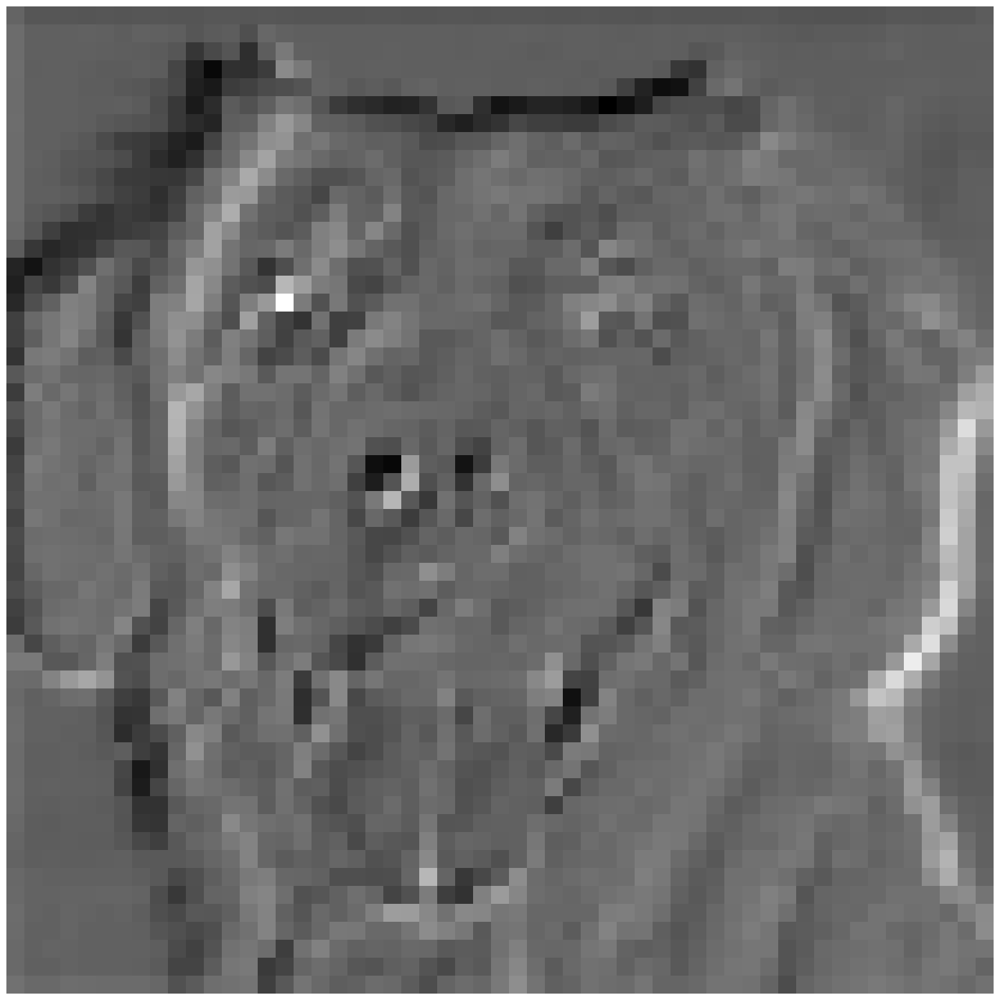

In [ ]:
plot(out[0,0,:,:]) #seeing how much the data changes in just the first pass through
#getting rid of extra data helps alexnet focus on only the DEFINING features of an image

After passing through the neural network and becoming a vector, the image is unrecognizable.  This is similar to how an eye processes light down into electrical signals in the brain, and the mind then assigns meaning to those signals.

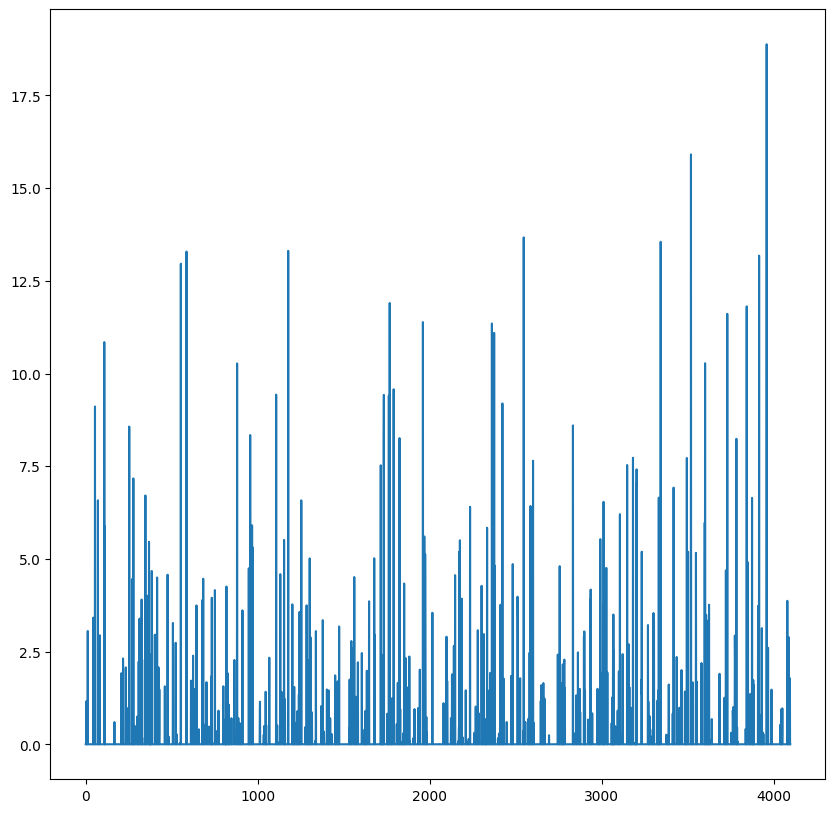

In [ ]:
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy()) #getting the first classifier
fig = plt.gcf()
fig.set_size_inches(10, 10) #plotting the classifier vector

In [ ]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php') #saving a new image to the im variable, from boca surf camera

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


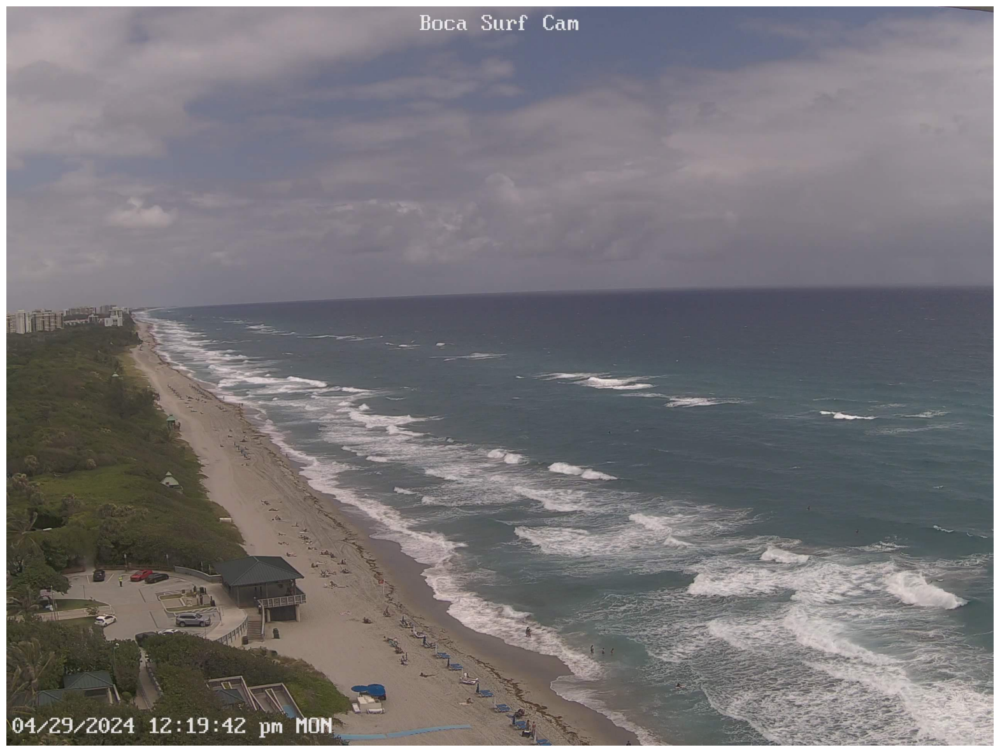

In [ ]:
plot(im) #showing the image saved

**Load_IM:** This function's purpose is to do all the preprocessing work in one function; calling the function will make the image ready for use by alexnet

In [ ]:
def load_im(im): #function name
    image = Image.fromarray(im) #converting to pil
    img_tensor = preprocess(image) #preprocessing the data using the defaults set
    img_tensor = img_tensor.unsqueeze_(0) #dimension shifting the tensor
    img_variable = torch.tensor(img_tensor).cuda(0) #setting to a torch object and sending to the graphics card where alexnet is loaded onto
    return img_variable #outputting the resulting tensor, for saving or running through alexnet

By making the function load_im, the code necessary to get from a url to an alexnet classifier has been greatly shortened.

In [ ]:
out = net(load_im(im)) #using the function, saving the classifier to the out variable

<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


**Inference:** This function will take an torch tensor input, run through alexnet to get the classifier, find the top 10 correlated values in it, and output both the best guess and the top ten guesses.

In [ ]:
def inference(im): #function name, input tensor
    out = net(load_im(im)) #saving the classifier result from alexnet locally
    label_index = out.cpu().data.numpy().argmax() #finding the best guess value
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:]) #finding the top ten guess values
    print(labels[label_index]) #printing the label of the best guess
    print('____') #printing a line
    for i in range(10): #for loop printing the top 10 guesses
        print(labels[top_list[i]])

Making a few functions and using prebuilt libraries reduces the necessary code for repeatedly classifying images to just a single function with a single input.

In [ ]:
inference(im) #running the inference function with our image of the beach as the input, everything else is neatly packaged away

seashore, coast, seacoast, sea-coast
____
seashore, coast, seacoast, sea-coast
promontory, headland, head, foreland
breakwater, groin, groyne, mole, bulwark, seawall, jetty
cliff, drop, drop-off
volcano
sandbar, sand bar
wing
valley, vale
lakeside, lakeshore
dam, dike, dyke


<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [28]:
%%capture
!pip install wandb #w and b stands for weights and biases, it's used to update alexnet based on training
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt #plotting in the document
import numpy as np #numerical python
import torch #neural networking framework
import requests
from torchvision import *
from torchvision.models import *
from flashtorch.utils import apply_transforms
import wandb as wb #neural network trainer

**GPU:** This function converts arrays into Torch objects, and sends them to the graphics card, where AlexNet is loaded.

In [29]:
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))

**Plot:** This function allows quick matplotlib image display

In [30]:
def plot(x):
    fig, ax = plt.subplots() #creating plotting area
    im = ax.imshow(x, cmap = 'gray') #putting image onto the plotting area with gray colormap
    ax.axis('off') #turning off axes
    fig.set_size_inches(5, 5) #setting default size
    plt.show() #displaying the plot

**Get_Google_Slides:** These two functions will divide the url up (get_google_slides) and convert each slide from a pdf to an image (get_slides)

**Load:** This function normalizes the slides to prepare to run through alexnet

In [31]:
def get_google_slide(url): #inputting the google slides url
    url_head = "https://docs.google.com/presentation/d/" #setting default url header
    url_body = url.split('/')[5] #splitting the url to get unique slide identifier
    page_id = url.split('.')[-1] #splitting the url to get unique page identifier
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id #constructing a new url for the pdf version of the slide

def get_slides(url): #inputting the google slides url
    url = get_google_slide(url) #converting it to the pdf url using the previous function
    r = requests.get(url, allow_redirects=True) #downloading the pdf to this notebook
    open('file.pdf', 'wb').write(r.content) #opening the pdf in the notebook
    images = convert_from_path('file.pdf', 500) #saving the slides to a variable
    return images #returning that variable

def load(image): #inputting the saved images

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device) #normalizing using the transforms from the wandb library

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") #setting the default device to the GPU, not the CPU

A dictionary of the labels which define the classifier:

In [32]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()} #getting the labels from the alexnet site

In [33]:
model = alexnet(weights='DEFAULT').to(device) #downloading alexnet to the notebook
model.eval();

In [34]:
url = "https://docs.google.com/presentation/d/1tlFULpPrI1j8vzVIRzrgrovdpKjaGbhpLyN7DcVPEOA/edit#slide=id.g2b78f466460_0_310" #saving the url of the slides to this notebook

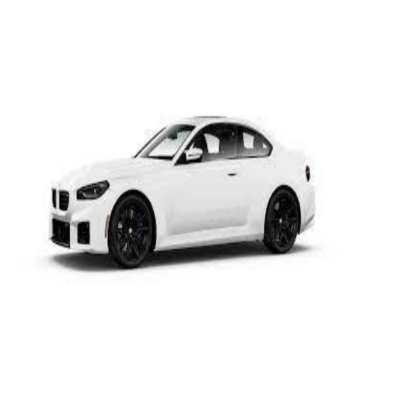

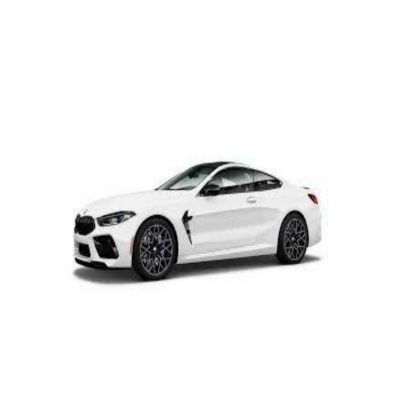

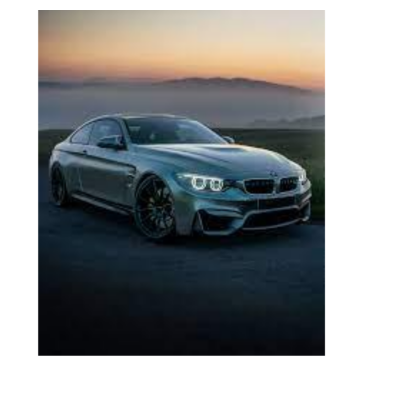

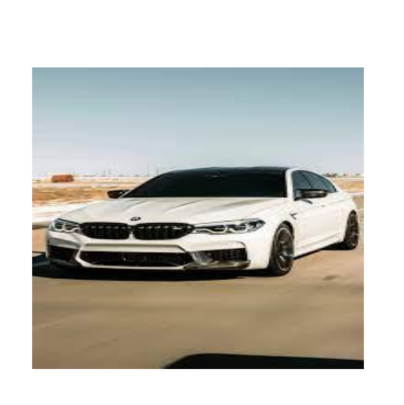

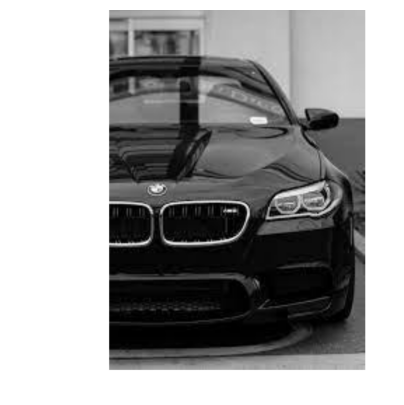

...

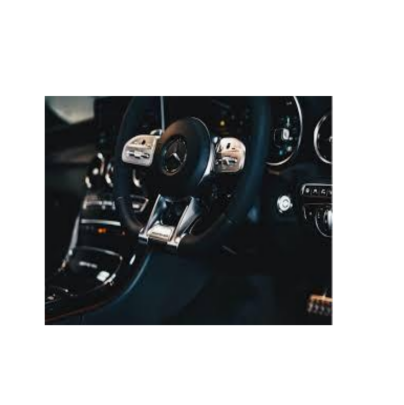

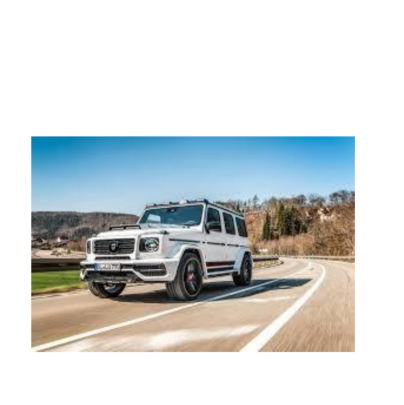

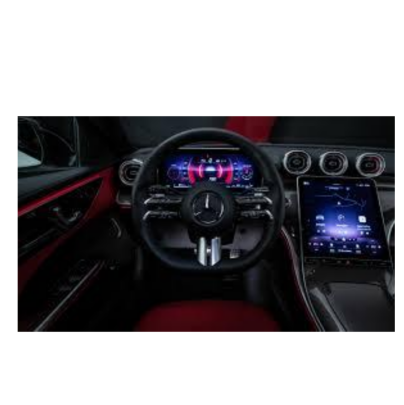

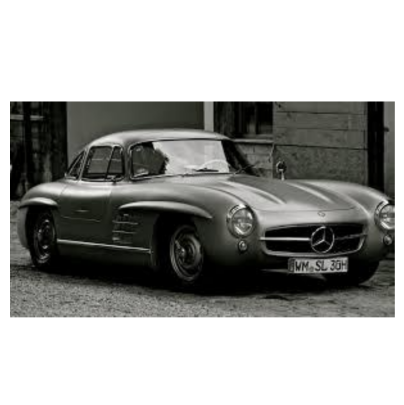

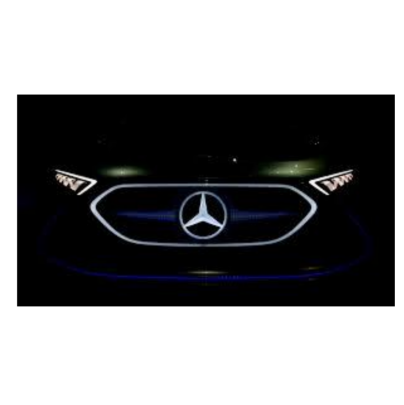

In [35]:
images = [] #creating an empty images list

for image in get_slides(url): #using a for loop to populate the images list with the slides from the url

    plot(image)

    images.append(load(image))

images = torch.vstack(images) #vertically stack the images in torch

In [36]:
images.shape #seeing the size of our data, 50 slides, 3 color channels each, all 224x224 pixels

torch.Size([50, 3, 224, 224])

**Model:** this function sends data through alexnet.  At the beginning there are 7.5 million individual values in our tensor, all shrunk down into a mere 50 classifier vectors.

In [37]:
model(images) #showing what our data looks like after it is converted into classifiers

tensor([[-3.0226, -5.0406, -1.2953,  ..., -5.8925, -2.5125,  3.2801],
        [-2.7945, -5.1890, -2.2297,  ..., -6.0959, -1.2240,  2.4052],
        [-2.6568, -2.4748,  0.5268,  ..., -5.5947, -1.8992,  3.1303],
        ...,
        [-2.7213, -2.8368, -2.5225,  ..., -4.5309, -2.1046,  0.0313],
        [-3.8427, -7.5435, -0.3773,  ..., -5.5858, -1.4127,  1.6341],
        [-6.2623, -4.7969, -3.6043,  ..., -3.8516, -1.4577,  3.4818]],
       grad_fn=<AddmmBackward0>)

In [38]:
y = model(images) #saving our classifiers to a variable

In [39]:
y.shape #seeing that the size has significantly reduced

torch.Size([50, 1000])

The guesses variable is saving the maximum value in each classifier to give alexnet's choice.

In [40]:
guesses = torch.argmax(y, 1).cpu().numpy()

The classifier maxima gives the guesses of what Alexnet thinks each image is based on its classifier.

In [41]:
for i in list(guesses):
    print(labels[i]) #printing the guesses out

car wheel
convertible
sports car, sport car
limousine, limo
Polaroid camera, Polaroid Land camera
limousine, limo
pug, pug-dog
grille, radiator grille
sports car, sport car
limousine, limo
television, television system
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
carpenter's kit, tool kit
racer, race car, racing car
racer, race car, racing car
racer, race car, racing car
convertible
minivan
red wine
CD player
racer, race car, racing car
convertible
corkscrew, bottle screw
convertible
notebook, notebook computer
sports car, sport car
sports car, sport car
cassette player
minibus
puck, hockey puck
sports car, sport car
web site, website, internet site, site
monitor
limousine, limo
perfume, essence
loudspeaker, speaker, speaker unit, loudspeaker system, speaker system
screen, CRT screen
garbage truck, dustcart
moving van
tow truck, tow car, wrecker
cassette player
sports car, sport car
analog clock
loudspeaker, speaker, speaker unit, loudspeaker syst

Creating a key: By making a list of length 50 and seperating the first and second half, we will show alexnet that we are giving it two types of images, and update its training based on the key.

In [42]:
Y = np.zeros(50,) #creating a key of length 50
Y[25:] = 1 #changing the last 25 values to 1

In [43]:
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [44]:
X = y.detach().cpu().numpy() #getting the values of guesses into each index of the key

In [45]:
X.shape

(50, 1000)

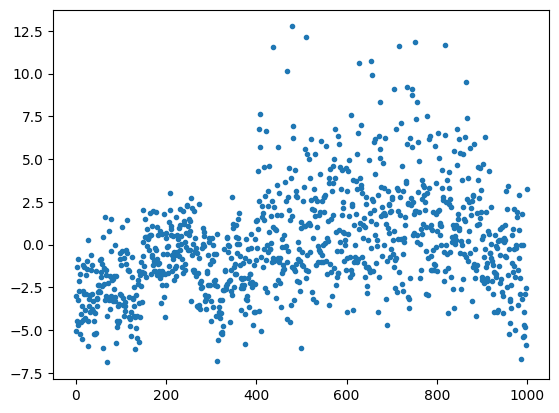

In [46]:
plt.plot(X[0],'.') #plotting the first value on the key to see a visualization of alexnet guesses

In [47]:
X[0] #printing all 1000 values out

array([-3.02263093e+00, -5.04060173e+00, -1.29529750e+00, -4.47596836e+00,
       -8.61903906e-01, -4.71304750e+00, -3.23146868e+00, -2.13539529e+00,
       -2.73779106e+00, -1.70764446e+00, -5.22648954e+00, -4.04998064e+00,
       -4.52709770e+00, -3.58164048e+00, -5.50717115e+00, -4.42174768e+00,
       -2.73891401e+00, -1.19240904e+00, -1.30523181e+00, -2.90200329e+00,
       -4.29178333e+00, -3.85123992e+00, -2.87825131e+00, -1.76137030e+00,
       -1.45403016e+00, -9.50305820e-01, -5.91792631e+00, -4.49314880e+00,
        2.69417942e-01, -3.60204768e+00, -3.21021652e+00, -2.94260693e+00,
       -3.96076560e+00, -6.10932767e-01, -1.48913360e+00, -3.78949070e+00,
       -1.20006800e+00, -2.88541055e+00, -3.29537892e+00, -3.90530515e+00,
       -5.20571470e+00, -4.49209213e+00, -3.99106407e+00, -5.23775148e+00,
       -5.15075159e+00, -1.56884694e+00, -3.14646649e+00, -3.57482195e+00,
       -3.18864250e+00, -2.75746012e+00, -2.33757639e+00, -2.71713972e+00,
       -2.38452840e+00, -

In [48]:
np.argmax(X[0]) #finding the index of the biggest one

479

In [49]:
labels[479] #getting the label

'car wheel'

In [50]:
top_ten = np.argsort(X[0])[::-1][0:10] #getting the top 10 values

In [51]:
for i in top_ten: #printing the corresponding labels
    print(labels[i])

car wheel
convertible
racer, race car, racing car
sports car, sport car
pickup, pickup truck
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
minibus
limousine, limo
cab, hack, taxi, taxicab
minivan


In [52]:
labels #printing the entire dictionary of labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 28., 132., 248., 263., 186.,  72.,  46.,  11.,   8.,   6.]),
 array([-6.89433813, -4.92910767, -2.96387696, -0.99864632,  0.96658432,
         2.93181491,  4.89704561,  6.86227608,  8.82750702, 10.79273701,
        12.75796795]),
 <BarContainer object of 10 artists>)

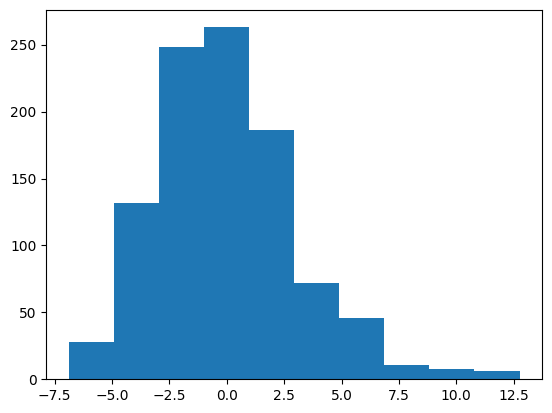

In [53]:
plt.hist(X[0]) #plotting a histogram of the classifier, very few values deviate from zero, those values which do are the guesses

In [54]:
X = GPU_data(X) #send the data and key to torch
Y = GPU_data(Y)

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

**Softmax:** For neural networking, a softmax function transform values into probabilities.  This helps make things like classification easier.

In [ ]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None]) #this is the definition of a softmax function
    s = s1 / s1.sum(1)[:,None]
    return s #returning a map of probabilities to compare against the key

**Cross-Entropy:** For neural networking, cross-entropy, or loss, is a function used to compare a probability distribution to the predicted result, the more dissimilar, the higher the loss, which helps the neural network adjust the weights and biases by the correct amount.

In [ ]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0] #this is the definition of the loss function

**Truncated Normal Distribution:** A normal distribution is used for the initial weights and biases, but to prevent slow learning, "truncated" normal distributions have an upper and lower bound due to the finite limitations of computing.

In [ ]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2) #this is the equation for our truncated normal function

    return z

**Accuracy:** Accuracy is simply a percentage which shows the rate at which a neural network correctly classifies data.  Tracking it over time helps seeing the progress of a network's learning.

In [ ]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0] #correct guesses/total guesses

In [ ]:
X.shape

In [ ]:
def get_batch(mode): #defining the function
    b = c.b #the size of the batch
    if mode == "train":
        r = np.random.randint(X.shape[0]-b) #setting default weights and biases and giving a guess based on the probability dist, then comparing to training key
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b) #setting default weights and biases and giving a guess based on weights and biases
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

In [ ]:
def model(x,w): #using matrix multiplication to generate classifier

    return x@w[0]

In [ ]:
def make_plots(): #track accuracy over time

    acc_train = acc(model(x,w),y)

    wb.log({"acc_train": acc_train})

In [ ]:
wb.init(project="Linear_Model_Photo_1");
c = wb.config

c.h = 0.001
c.b = 4 #batch sizes
c.epochs = 100000 #runs

w = [GPU(Truncated_Normal((1000,2)))] #generate normally distributed weights

optimizer = torch.optim.Adam(w, lr=c.h) #use built-in torch optimizer (Adam)

for i in range(c.epochs):

    x,y = get_batch('train') #set mode to train

    loss = cross_entropy(softmax(model(x,w)),y) #calculate loss

    optimizer.zero_grad() #reset optimizer
    loss.backward() #adjust weights
    optimizer.step() #move to next run in the optomizer

    wb.log({"loss": loss}) #send loss to wandb

    make_plots() #generate graphs
